In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import transforms
from mantis_shrimp import datasets

In [3]:
class JitterCrop:
    '''takes in image of size (npix, npix, nchannel), 
    jitters by uniformly drawn (-jitter_lim, jitter_lim),
    and returns (outdim, outdim, nchannel) central pixels'''

    def __init__(self, outdim=96, jitter_lim=7):
        self.outdim = outdim
        self.jitter_lim = jitter_lim
        
    def __call__(self, image):                            
        if self.jitter_lim:
            center_x = image.shape[2]//2 + int(np.random.randint(-self.jitter_lim, self.jitter_lim+1, 1))
            center_y = image.shape[3]//2 + int(np.random.randint(-self.jitter_lim, self.jitter_lim+1, 1))
        else:
            center_x = image.shape[2]//2
            center_y = image.shape[3]//2
        offset = self.outdim//2

        return image[:,:,(center_x-offset):(center_x+offset), (center_y-offset):(center_y+offset)]


In [37]:
jitter_ps = JitterCrop(120,4)
jitter_unwise = JitterCrop(22,1)
jitter_galex = JitterCrop(22,1)


augment_ps = transforms.CenterCrop((120,120))
augment_unwise = transforms.CenterCrop((11,11)) #2.75 arcsec/pix
augment_galex = transforms.CenterCrop((22,22)) #1.5 arcsec/pix
upsample = transforms.Resize((120,120),antialias=True)
random_resize_crop = transforms.RandomResizedCrop(120,(0.95,1.05),(0.95,1.05))

#early_fusion augmentation
def augment_fn(_galex,_ps,_unwise):

    
    angle = np.random.random() * 360.
    _ps = transforms.functional.rotate(_ps,angle)
    _unwise = transforms.functional.rotate(_unwise,angle)
    _galex = transforms.functional.rotate(_galex,angle)
    
    if np.random.random() > 0.5:
        _ps = transforms.functional.hflip(_ps)
        _unwise = transforms.functional.hflip(_unwise)
        _galex = transforms.functional.hflip(_galex)
    if np.random.random() > 0.5:
        _ps = transforms.functional.vflip(_ps)
        _unwise = transforms.functional.vflip(_unwise)
        _galex = transforms.functional.vflip(_galex)

    if True:
        ###crop each to remove the black parts from the rotation.
        #use jitter crop instead to see what happens
        _ps = augment_ps(_ps)
        _unwise = augment_unwise(_unwise)
        _galex = augment_galex(_galex)
        
        
        #finally, we upsample
        _unwise = upsample(_unwise)
        _galex = upsample(_galex)
    else:
        _ps = random_resize_crop(_ps)
        _galex = random_resize_crop(_galex)
        _unwise = random_resize_crop(_unwise)
    
    return _galex,_ps,_unwise

def augment_fn_late(_galex,_ps,_unwise):

    angle = np.random.random() * 360.
    _ps = transforms.functional.rotate(_ps,angle)
    _unwise = transforms.functional.rotate(_unwise,angle)
    _galex = transforms.functional.rotate(_galex,angle)
    
    if np.random.random() > 0.5:
        _ps = transforms.functional.hflip(_ps)
        _unwise = transforms.functional.hflip(_unwise)
        _galex = transforms.functional.hflip(_galex)
    if np.random.random() > 0.5:
        _ps = transforms.functional.vflip(_ps)
        _unwise = transforms.functional.vflip(_unwise)
        _galex = transforms.functional.vflip(_galex)

    if True:
        ###crop each to remove the black parts from the rotation.
        #use jitter crop instead to see what happens
        _ps = augment_ps(_ps)
        _unwise = augment_unwise(_unwise)
        _galex = augment_galex(_galex)
        
        
        #finally, we upsample
        #_unwise = upsample(_unwise)
        #_galex = upsample(_galex)
    else:
        _ps = random_resize_crop(_ps)
        _galex = random_resize_crop(_galex)
        _unwise = random_resize_crop(_unwise)
    
    return _galex,_ps,_unwise

In [6]:
MSD = datasets.MantisShrimpDataset('val',0,transform=True,set_zero=True)

In [33]:
def visualize(galex,ps,unwise,late=False):
    
    if not(late):
        galex_viz = np.zeros((120,120,3))
        ps_viz = np.zeros((120,120,3))
        unwise_viz = np.zeros((120,120,3))
    else:
        galex_viz = np.zeros((22,22,3))
        ps_viz = np.zeros((120,120,3))
        unwise_viz = np.zeros((11,11,3))
        

    if galex.shape[0] == 2:
        #mimic Legacy survey viewer
        galex_viz[:,:,0] = galex[1,:,:] #FUV
        galex_viz[:,:,1] = galex[1,:,:] #FUV
        galex_viz[:,:,2] = galex[0,:,:] #NUV
        
    if ps.shape[0] == 5:
        ps_viz[:,:,0] = ps[3,:,:]
        ps_viz[:,:,1] = ps[2,:,:]
        ps_viz[:,:,2] = ps[1,:,:]
    
    if unwise.shape[0] == 2:
        unwise_viz[:,:,0] = unwise[0,:,:]
        unwise_viz[:,:,1] = unwise[0,:,:]
        unwise_viz[:,:,2] = unwise[1,:,:]

    fig = plt.figure(figsize=(10,10))
    plt.subplot(1,3,1)
    plt.title('GALEX',fontsize=20)
    plt.imshow(galex_viz)
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1,3,2)
    plt.title('PanSTARRs',fontsize=20)
    plt.imshow(ps_viz)
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1,3,3)
    plt.imshow(unwise_viz)
    plt.title('WISE',fontsize=20)
    plt.xticks([])
    plt.yticks([])
    
    plt.show()

In [23]:
indices = np.where((np.logical_and(MSD.z>0.04,MSD.z<0.05)))[0]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


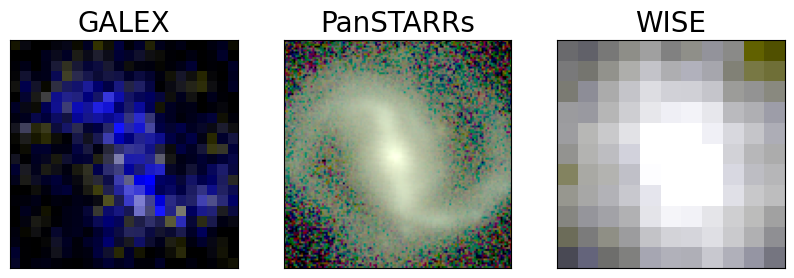

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


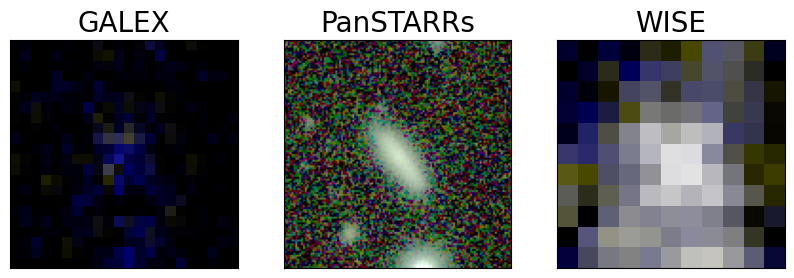

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


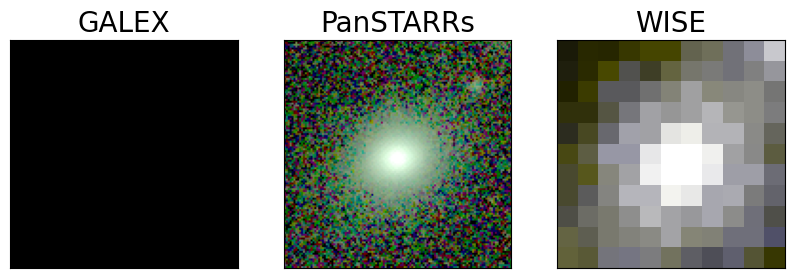

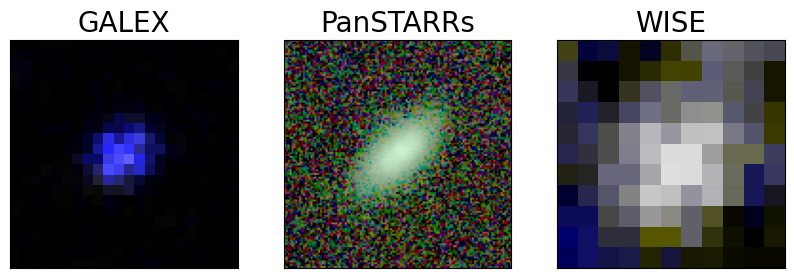

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


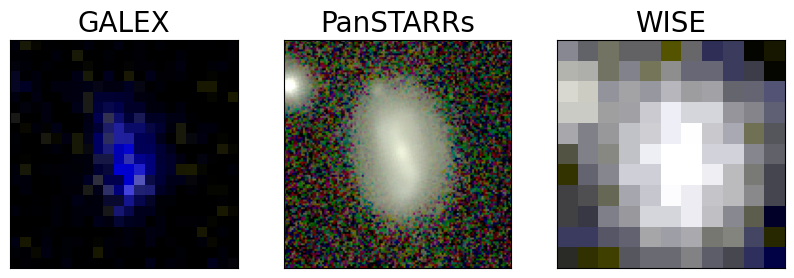

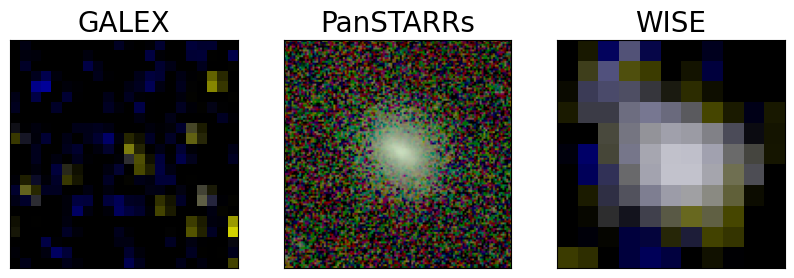

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


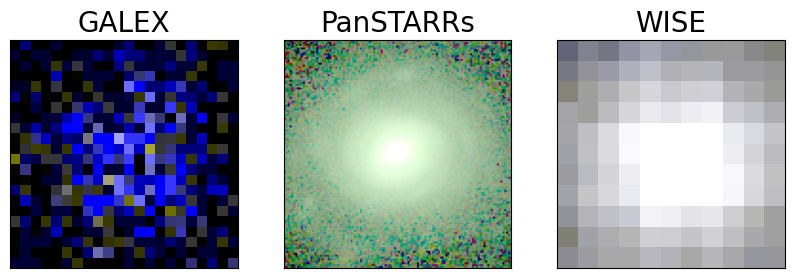

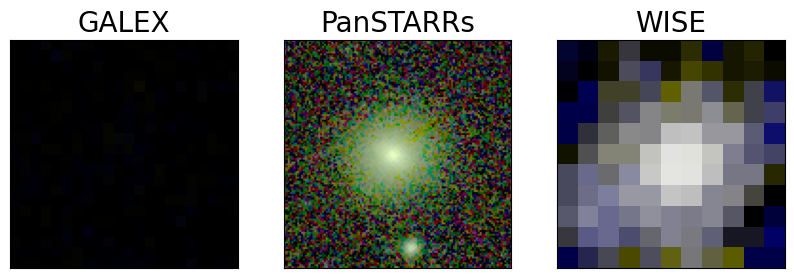

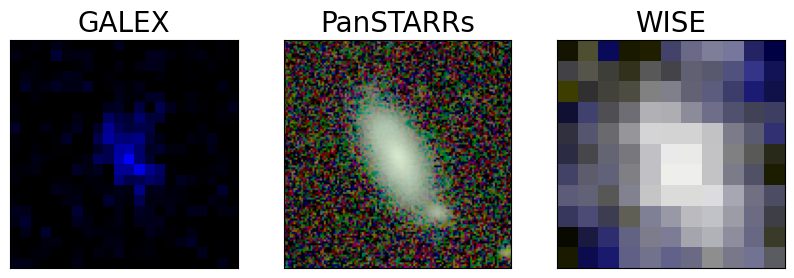

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


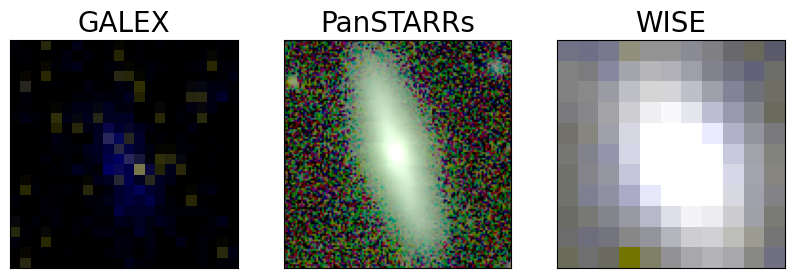

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


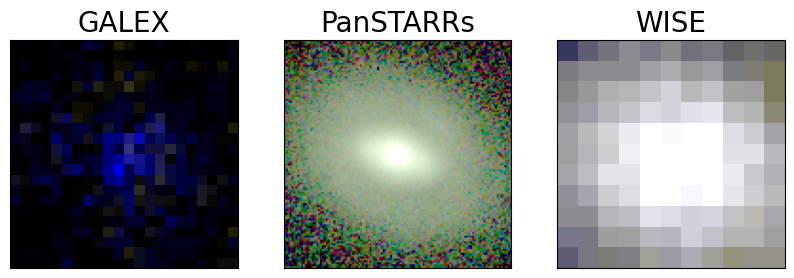

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


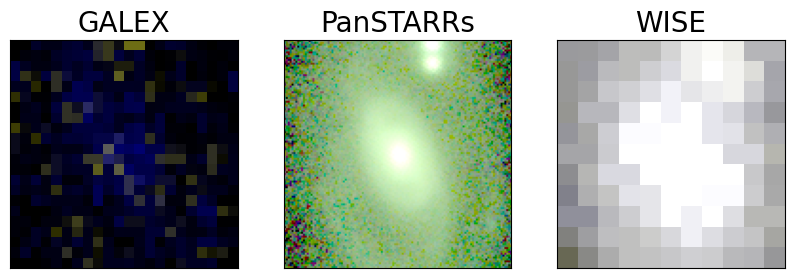

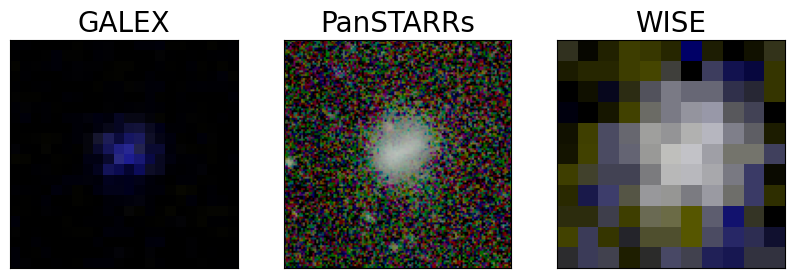

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


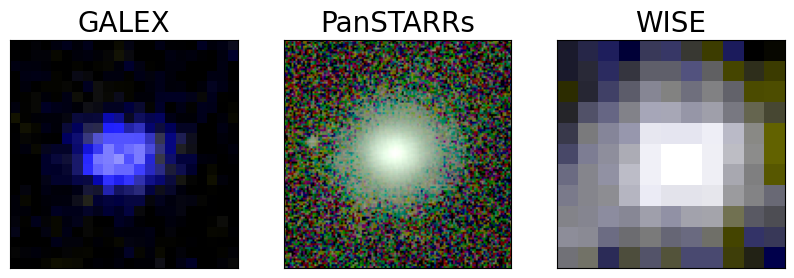

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


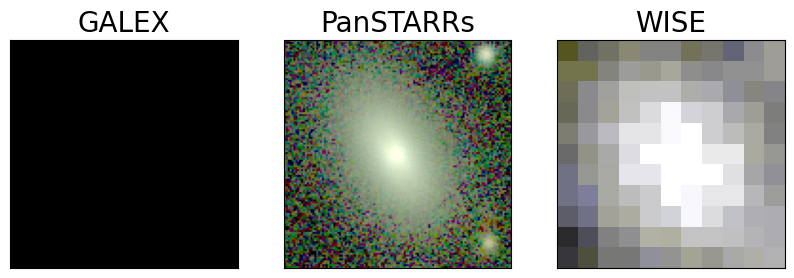

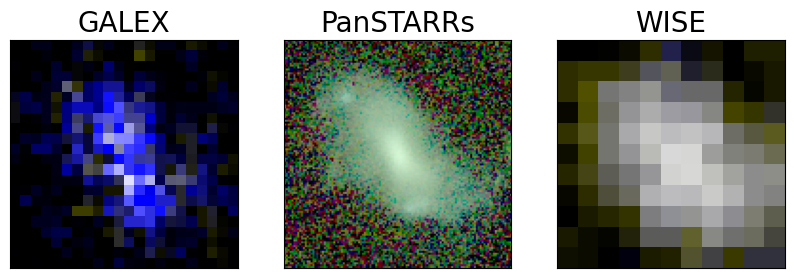

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


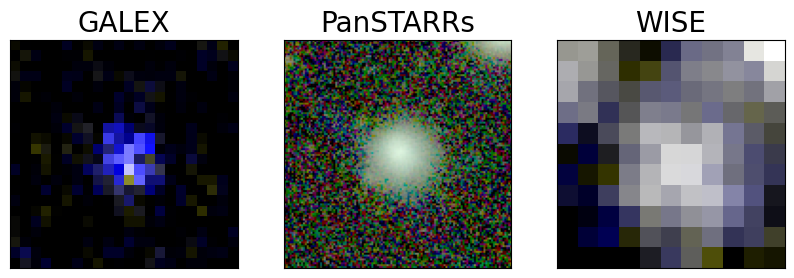

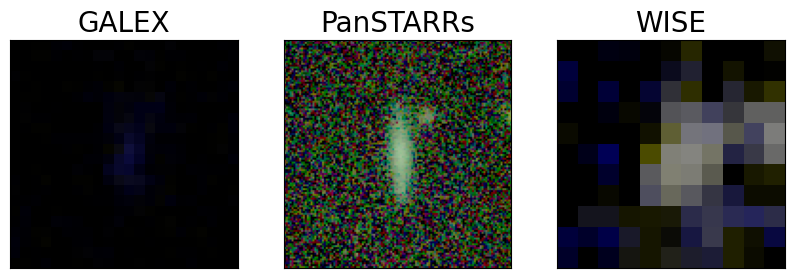

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


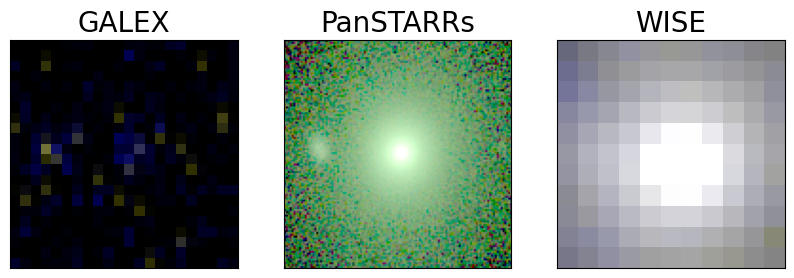

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


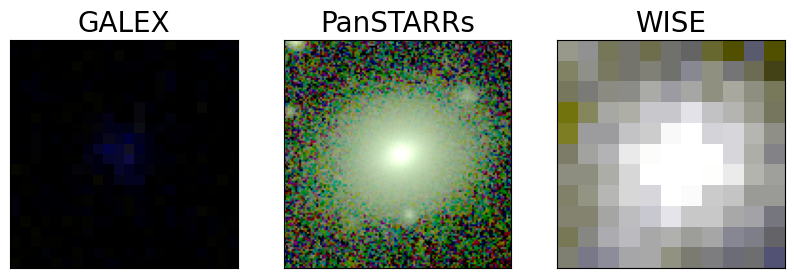

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


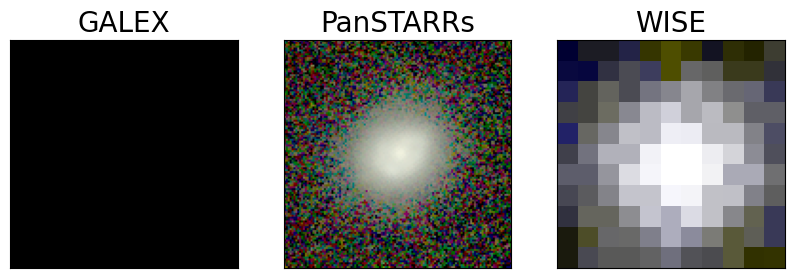

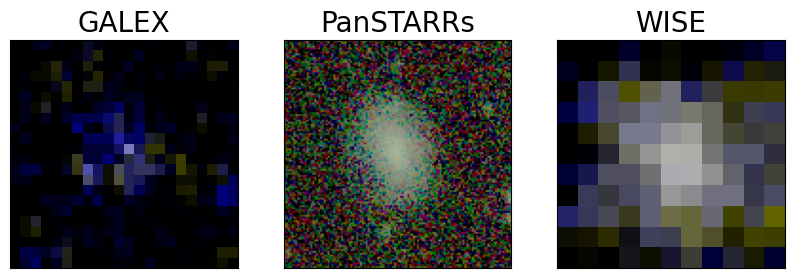

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


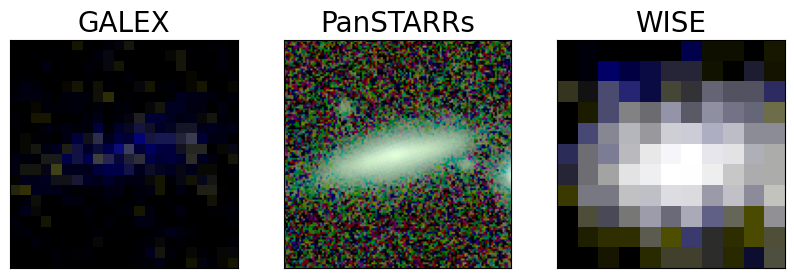

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


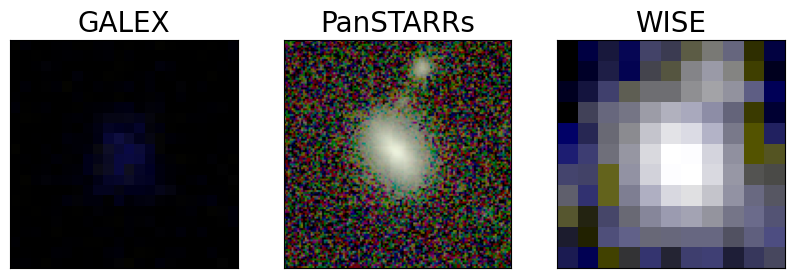

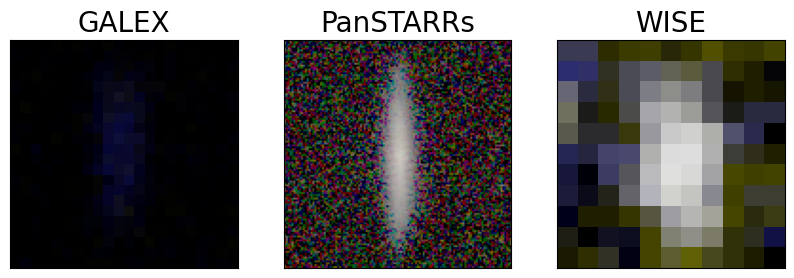

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


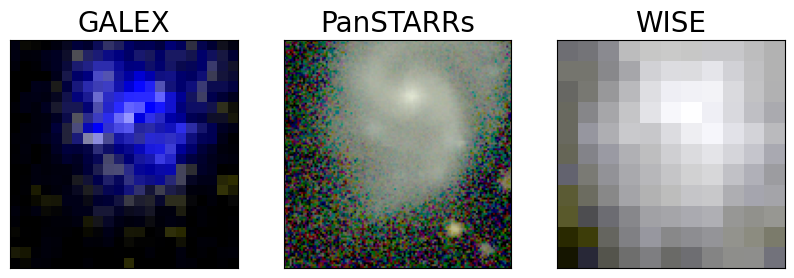

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


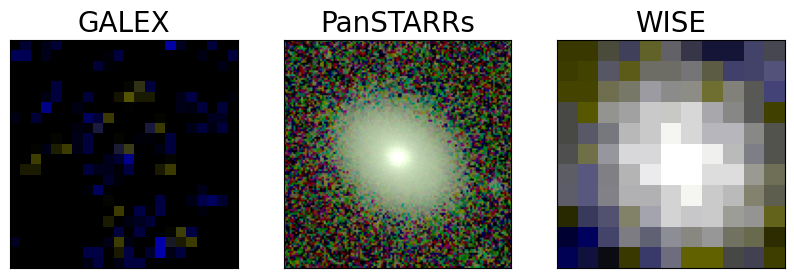

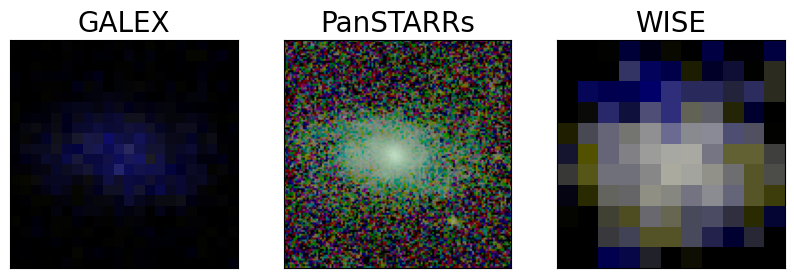

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


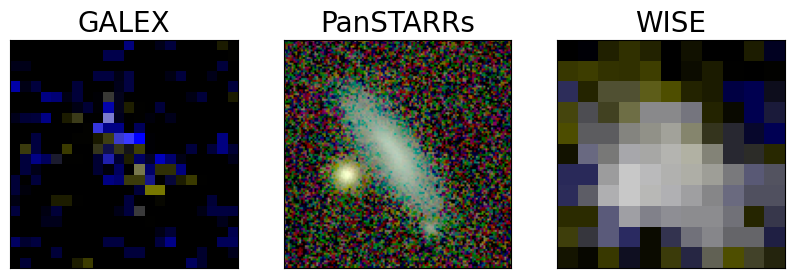

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


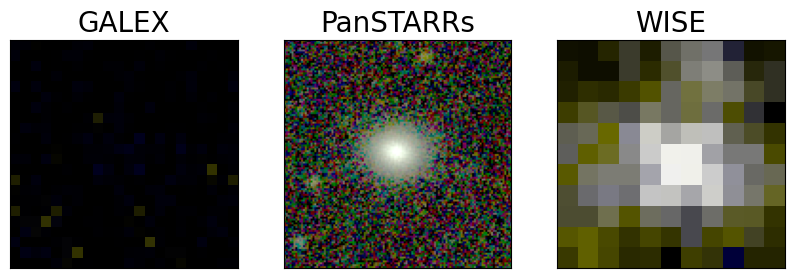

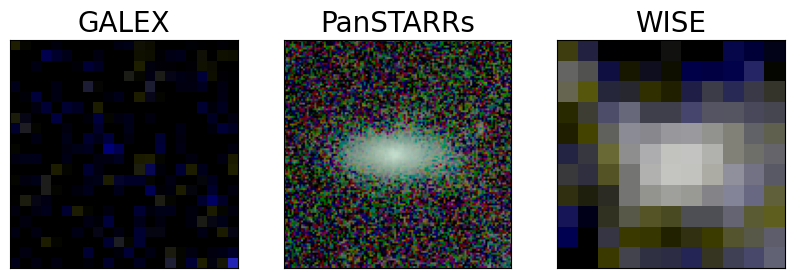

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


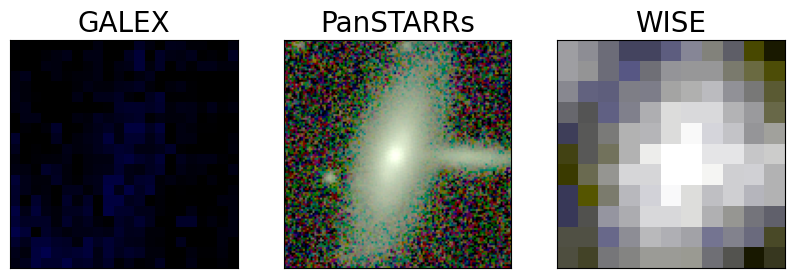

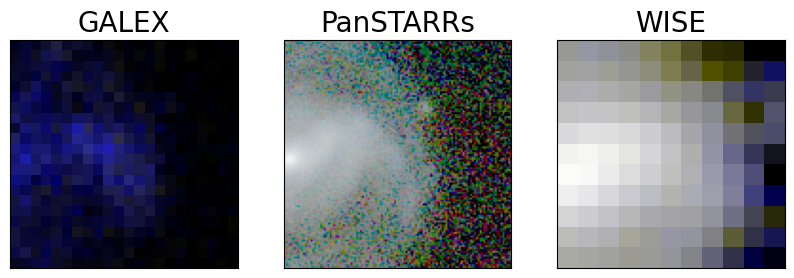

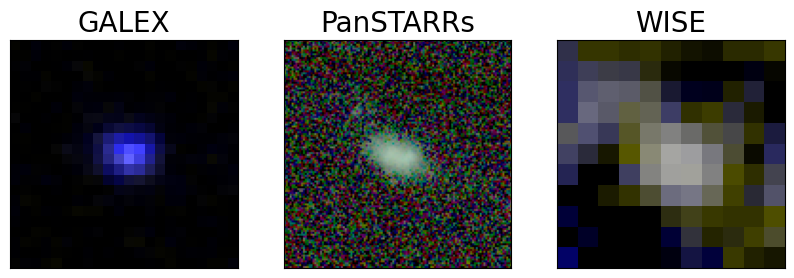

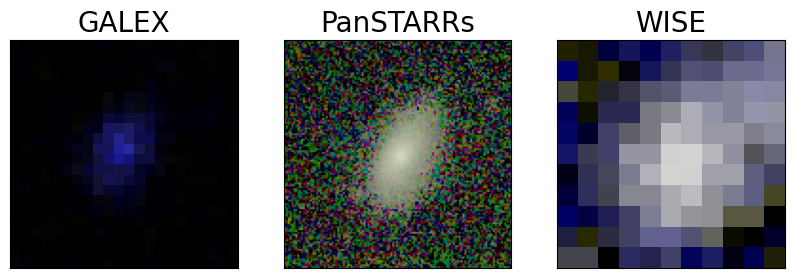

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


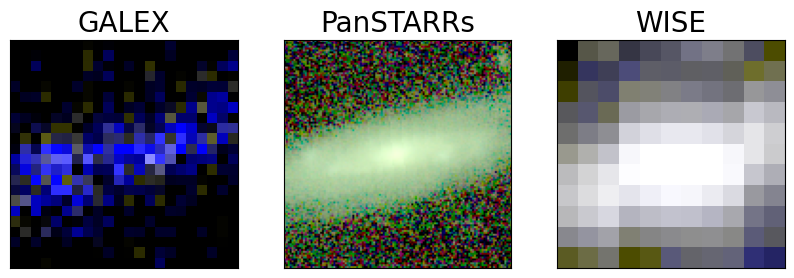

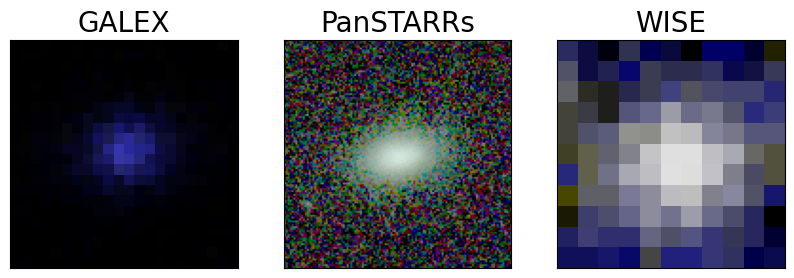

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


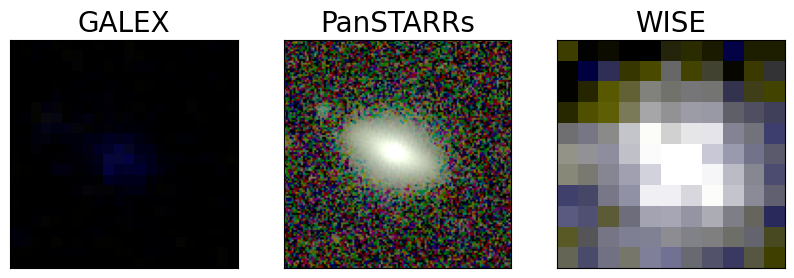

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


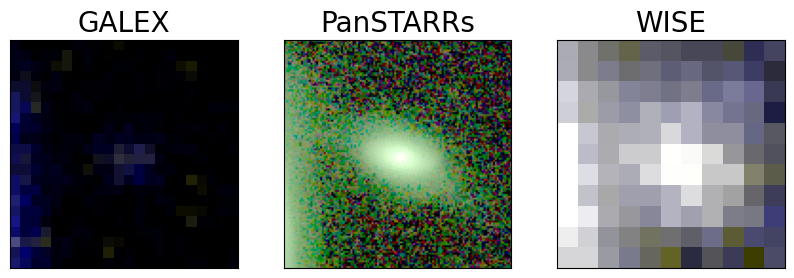

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


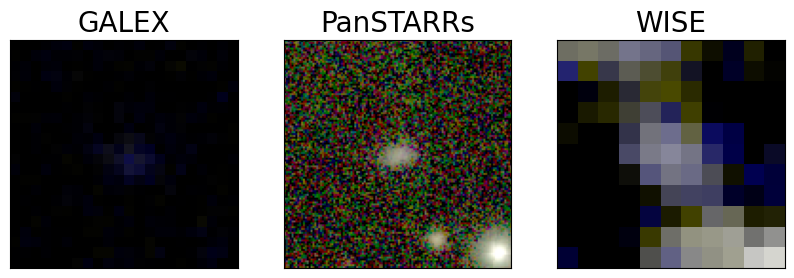

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


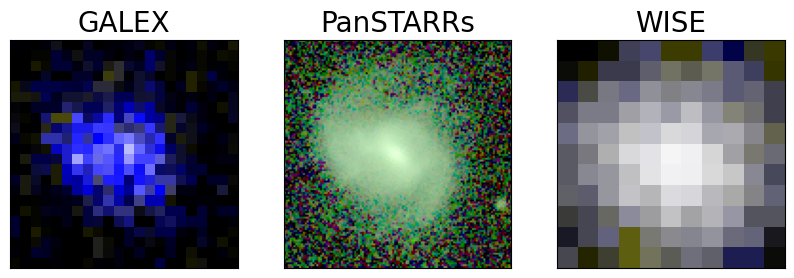

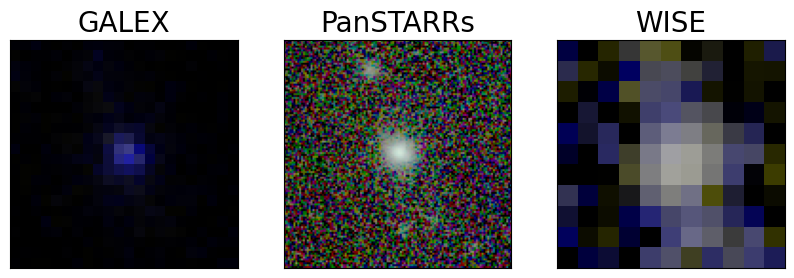

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


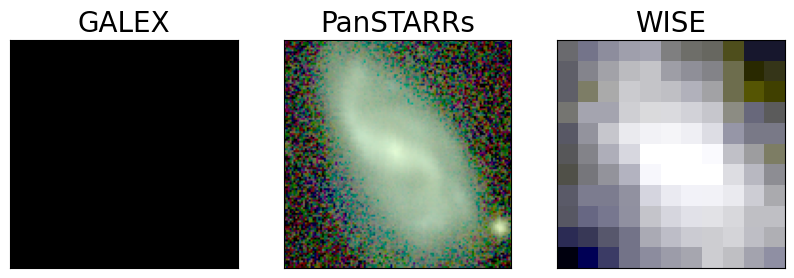

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


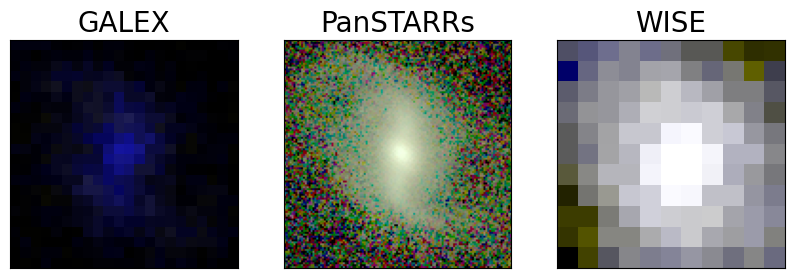

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


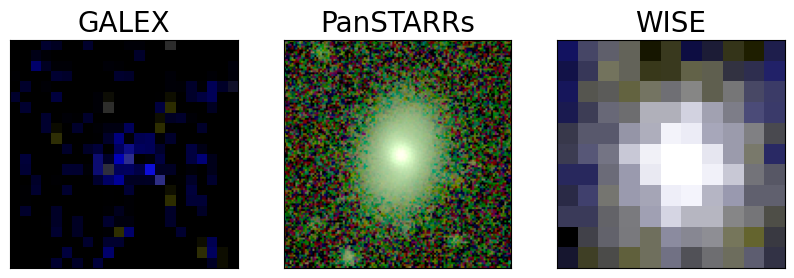

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


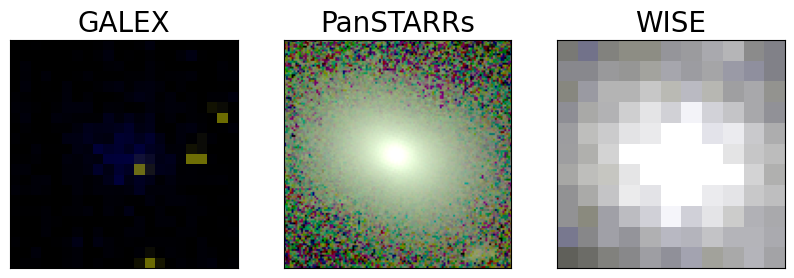

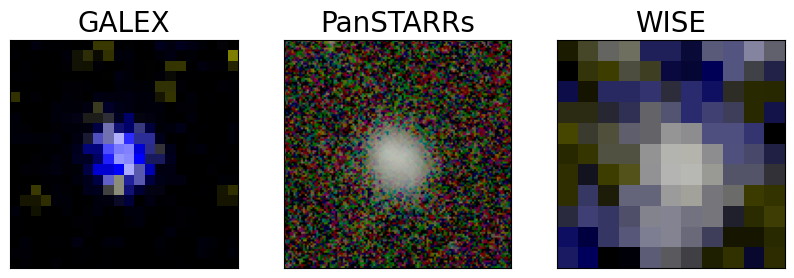

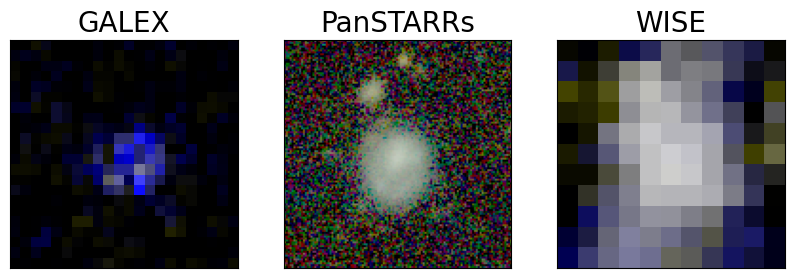

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


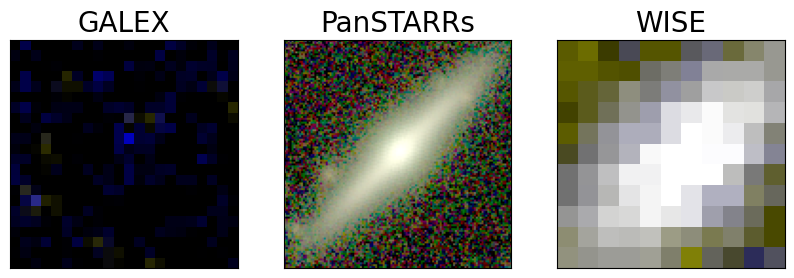

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


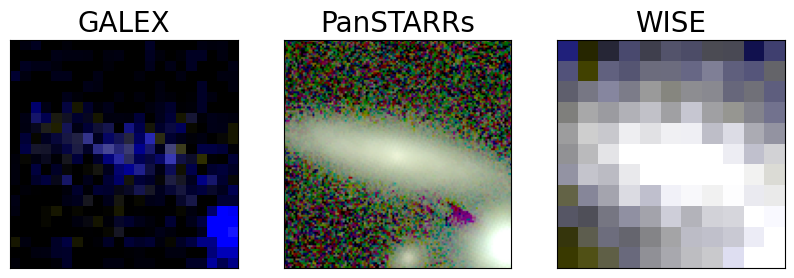

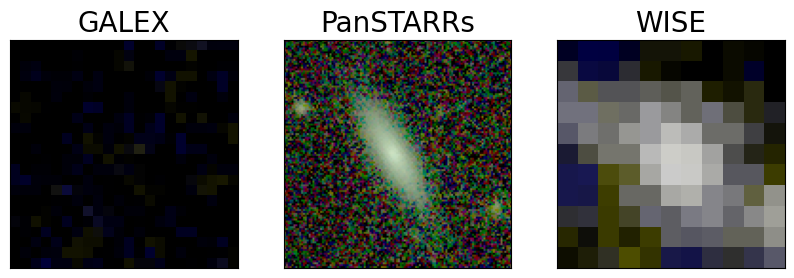

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


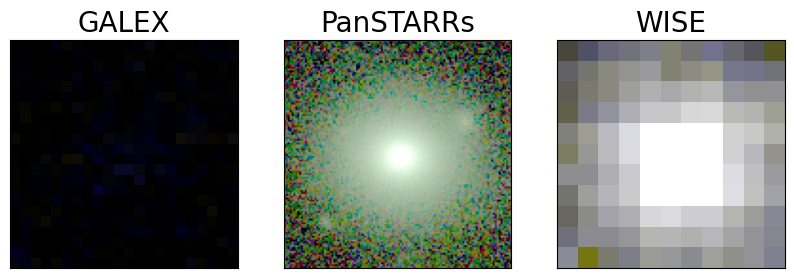

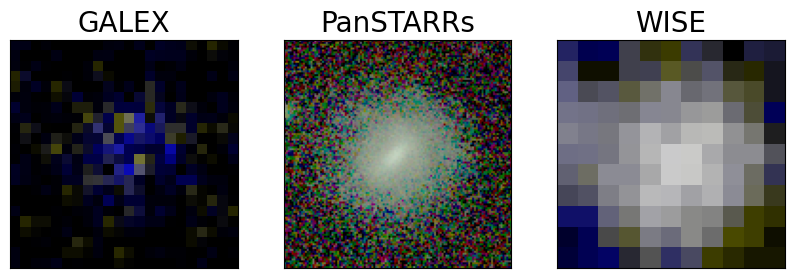

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


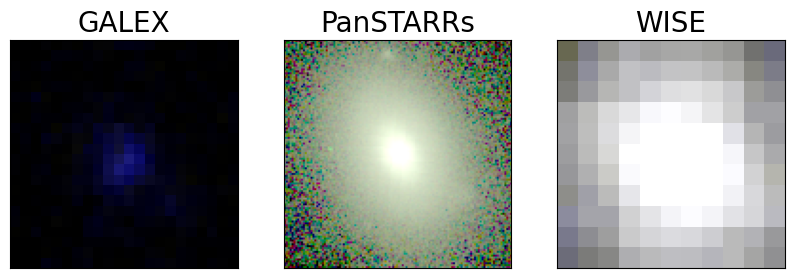

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


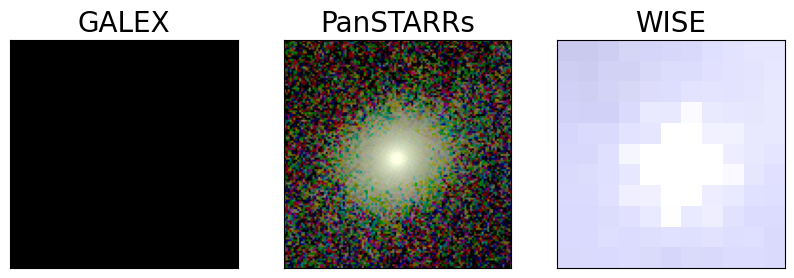

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


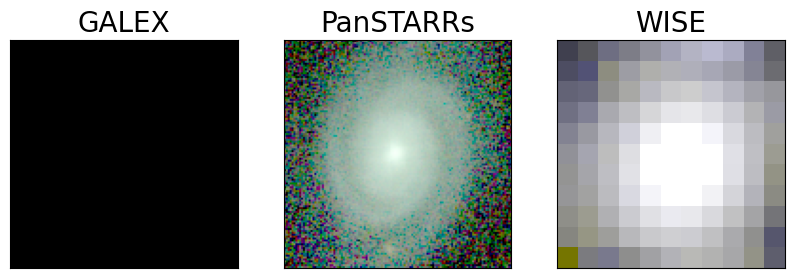

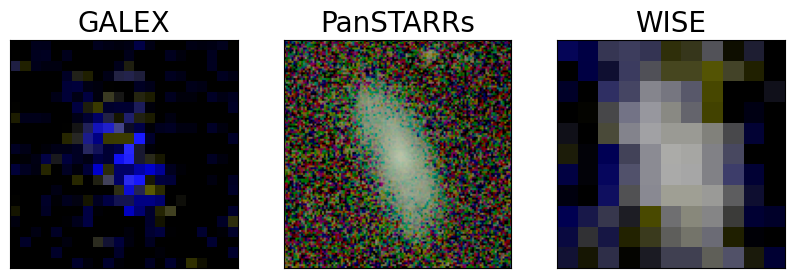

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


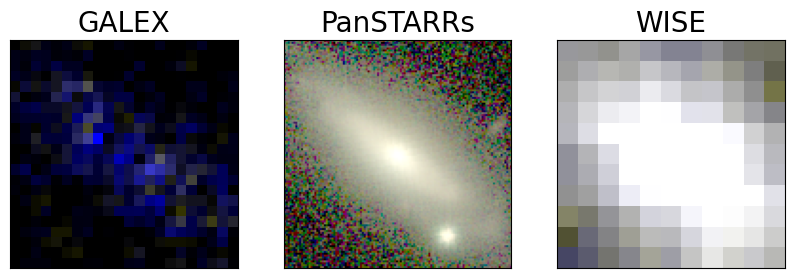

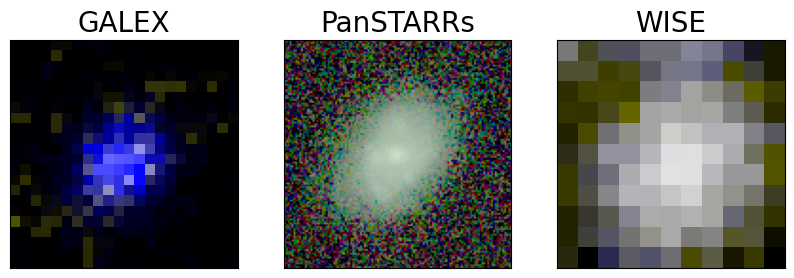

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


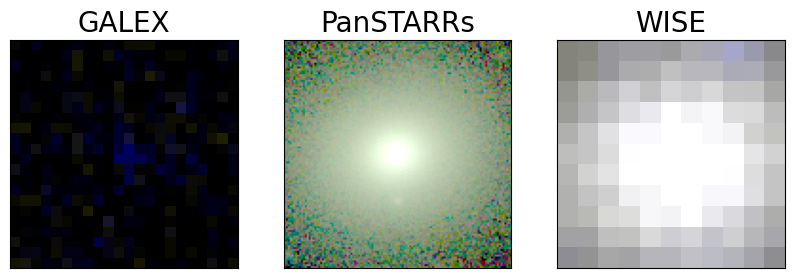

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


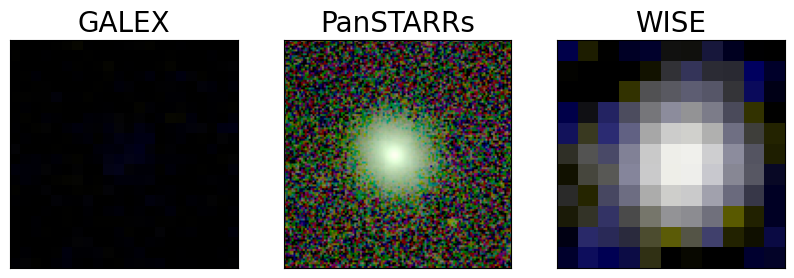

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


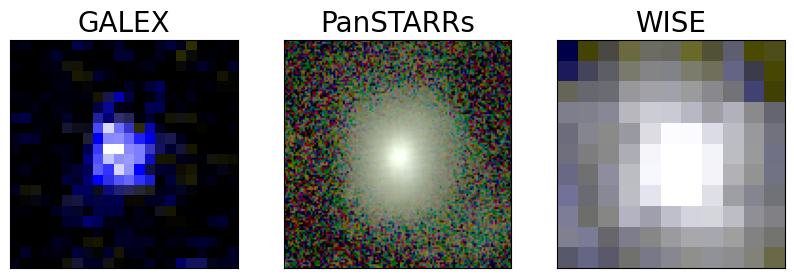

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


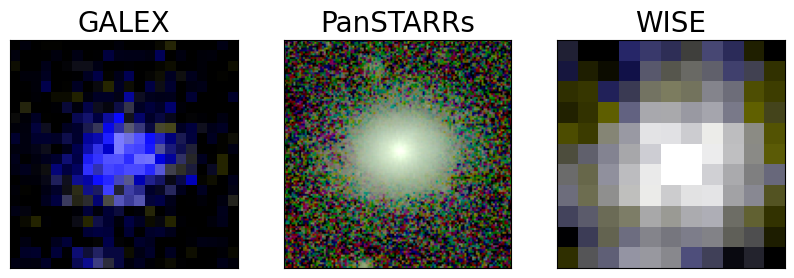

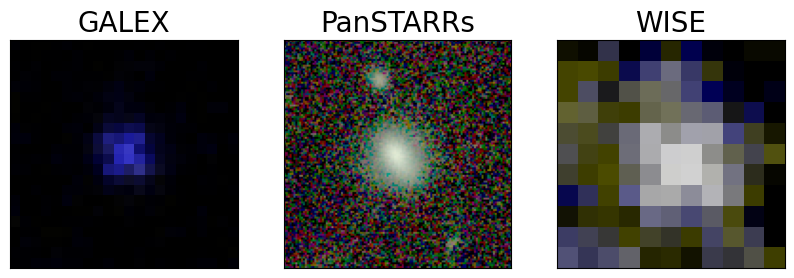

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


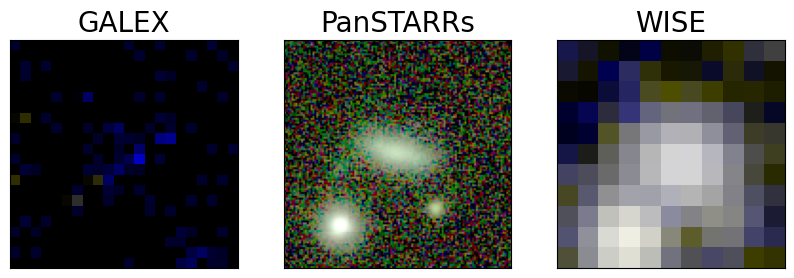

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


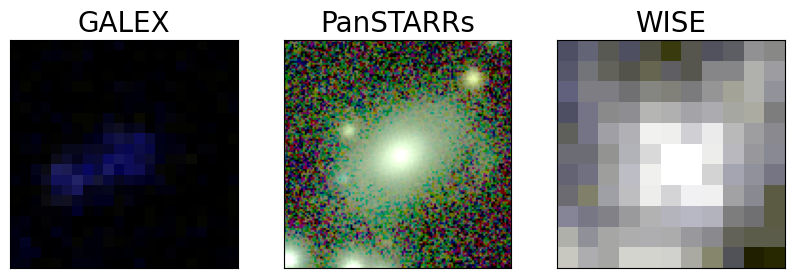

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


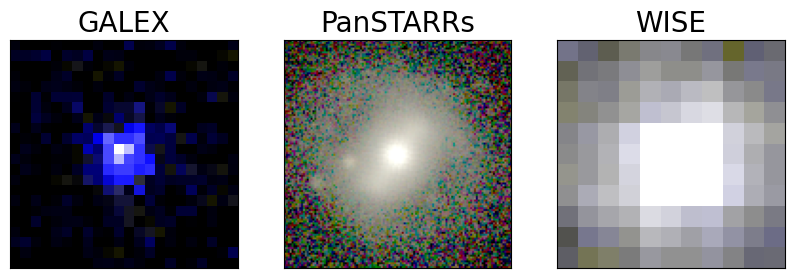

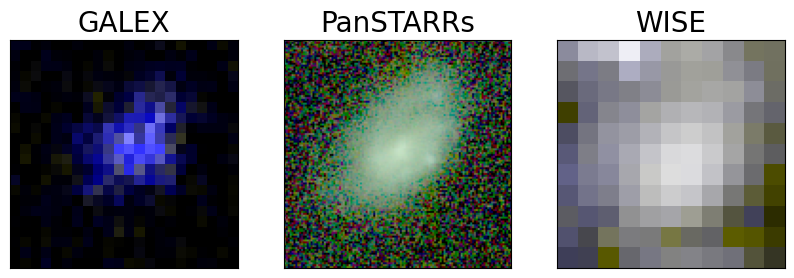

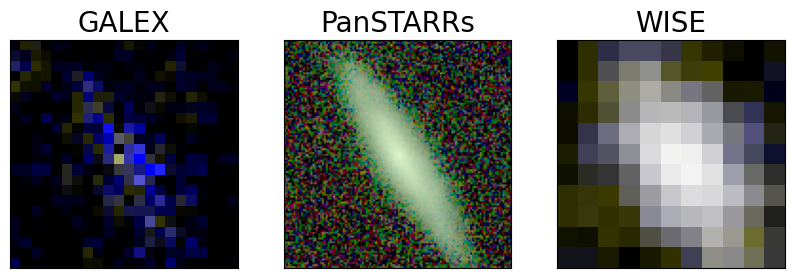

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


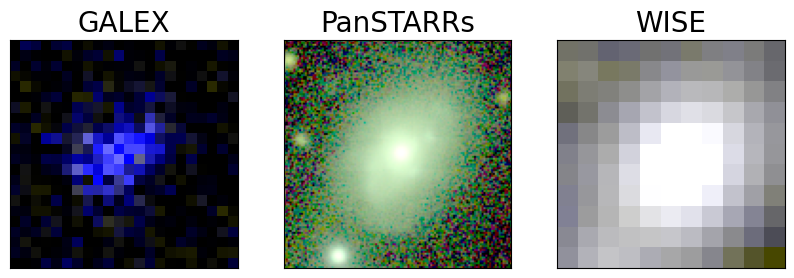

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


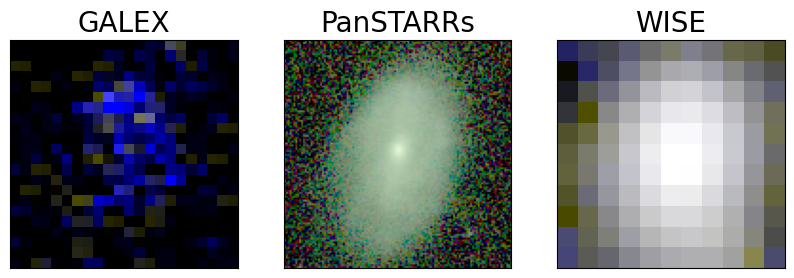

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


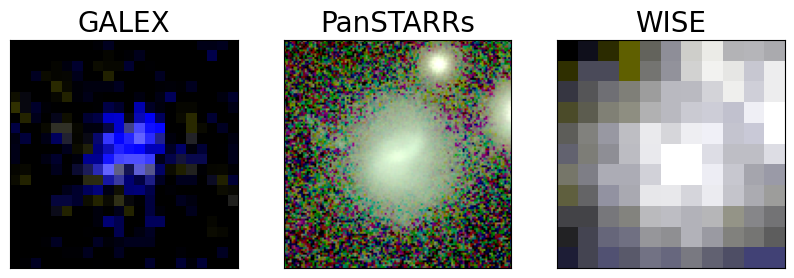

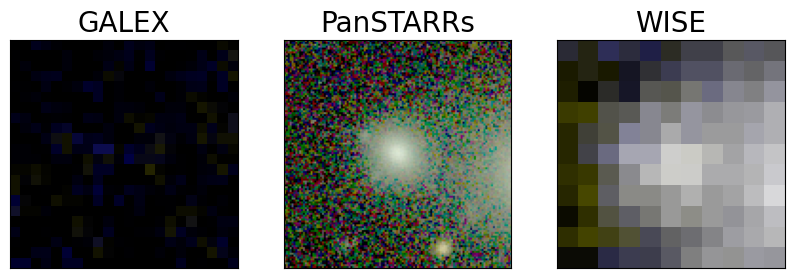

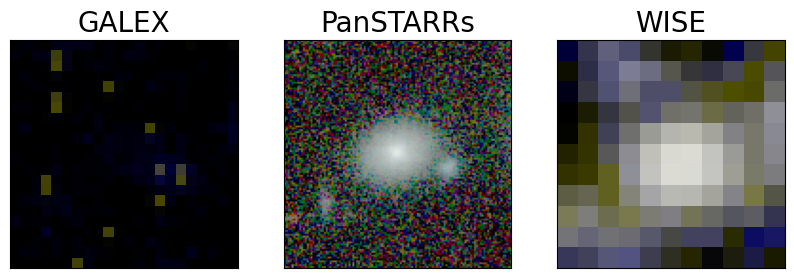

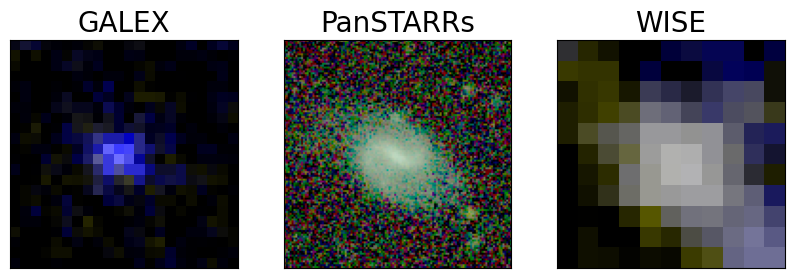

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


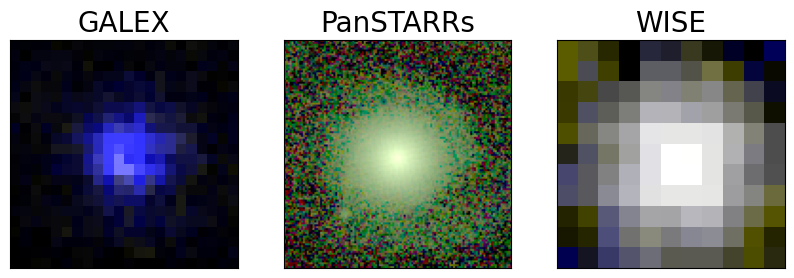

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


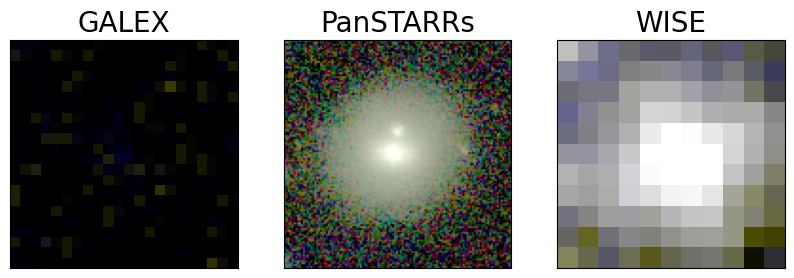

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


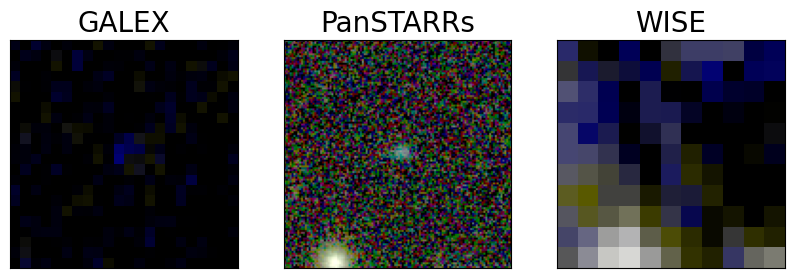

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


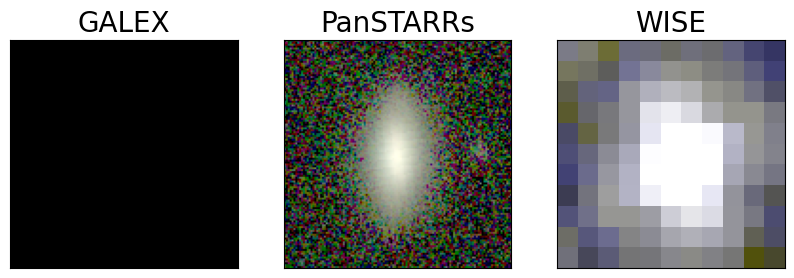

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


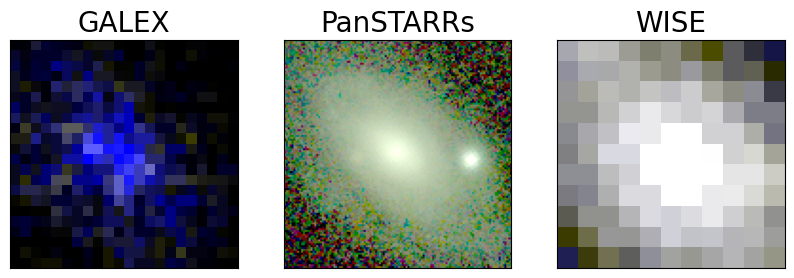

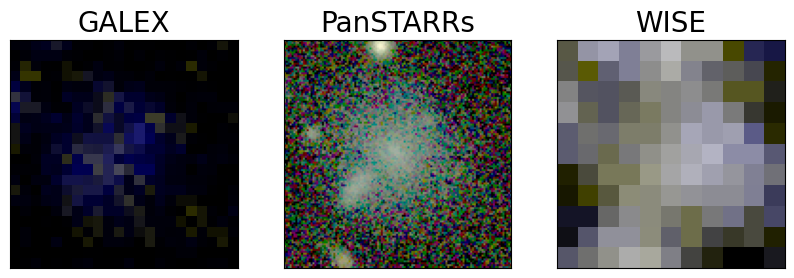

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


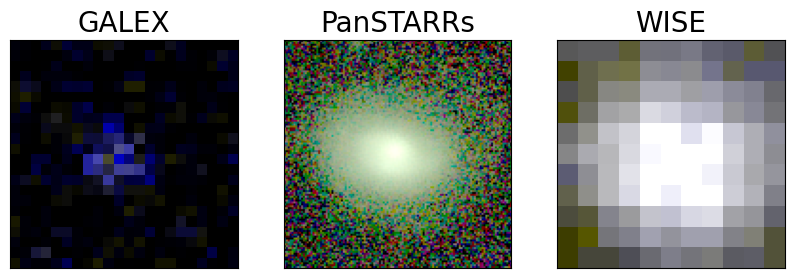

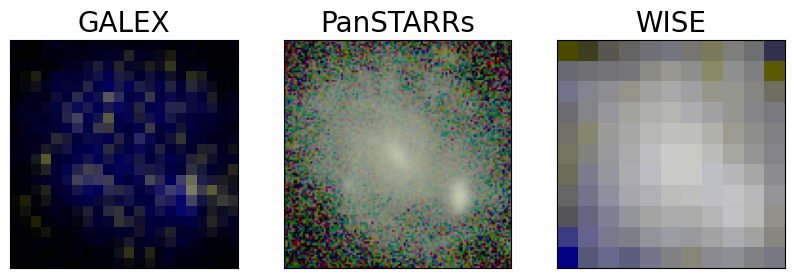

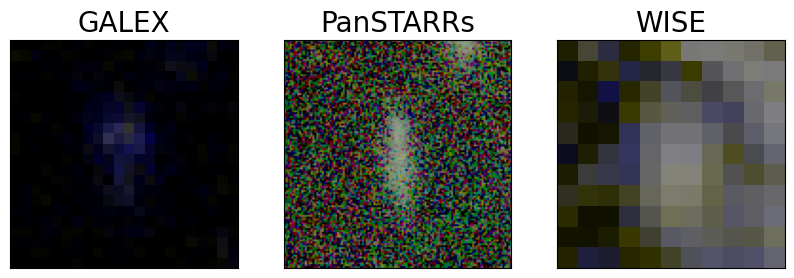

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


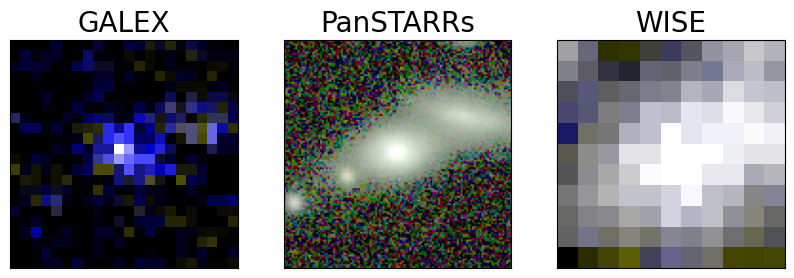

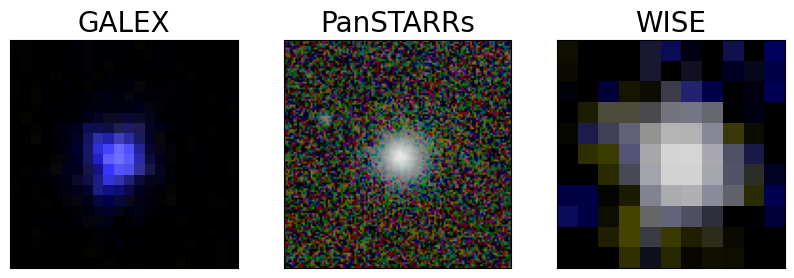

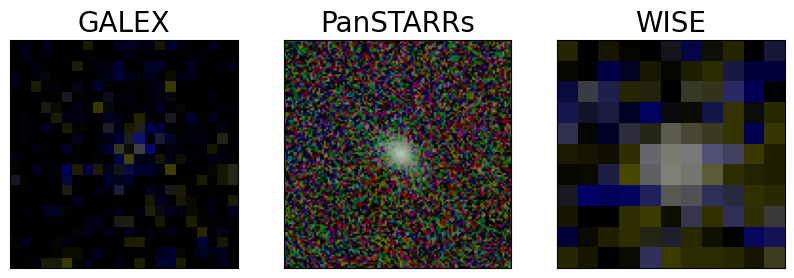

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


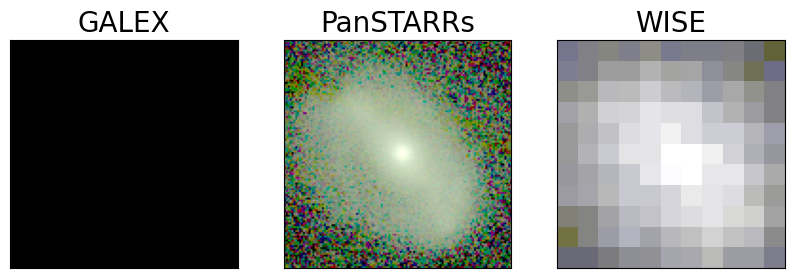

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


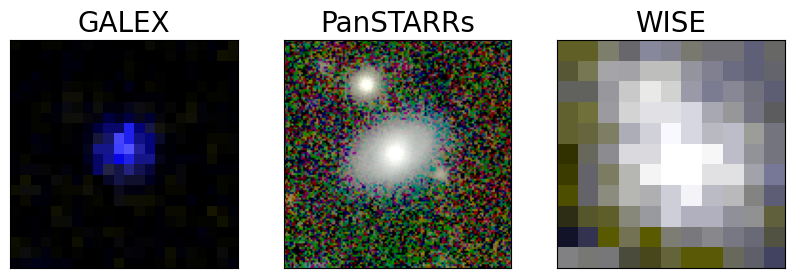

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


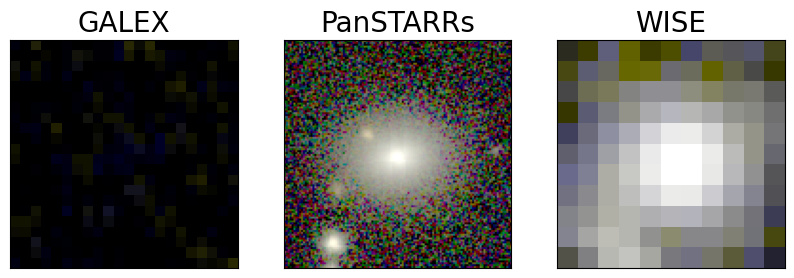

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


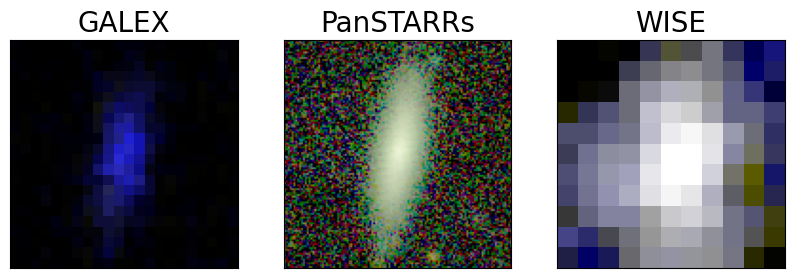

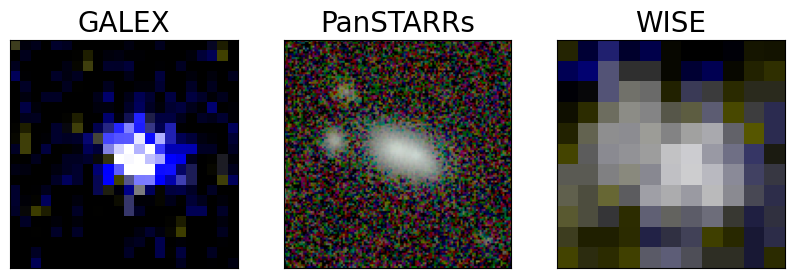

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


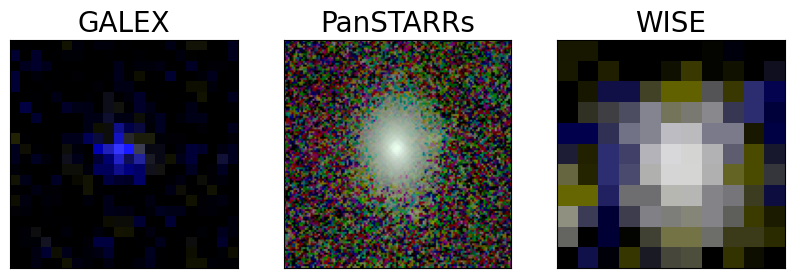

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


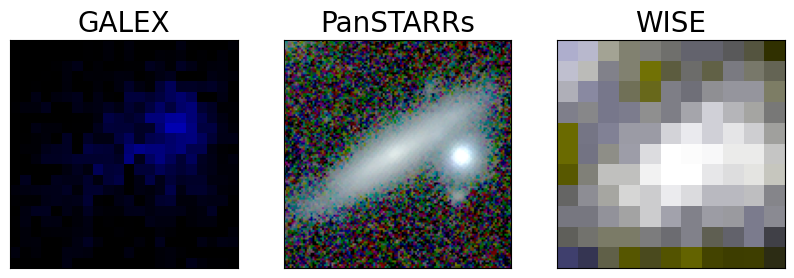

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


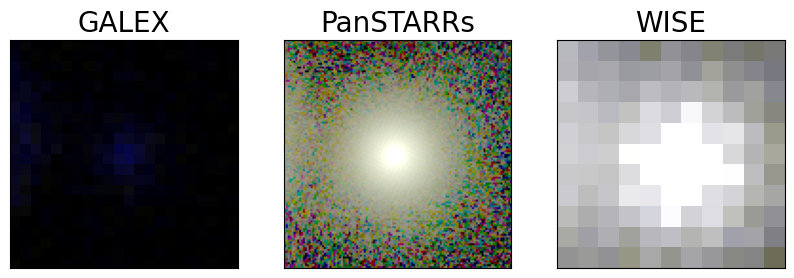

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


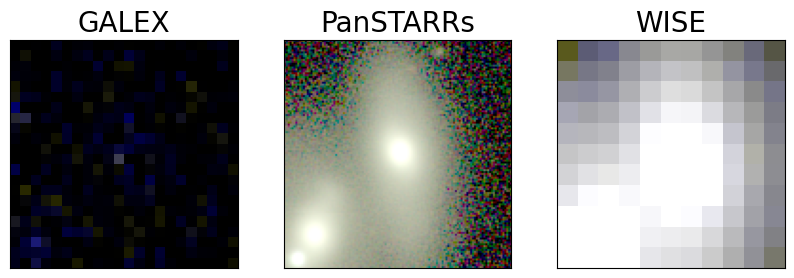

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


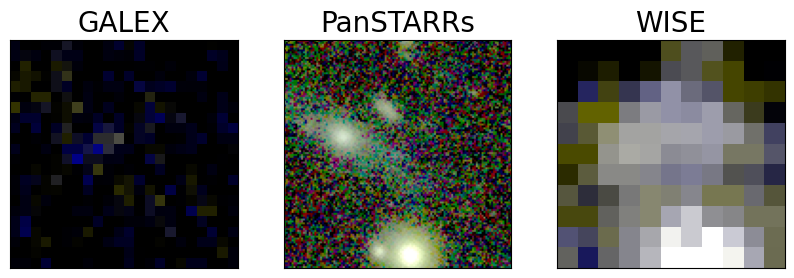

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


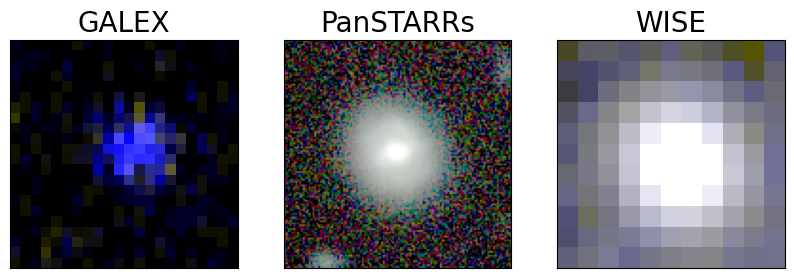

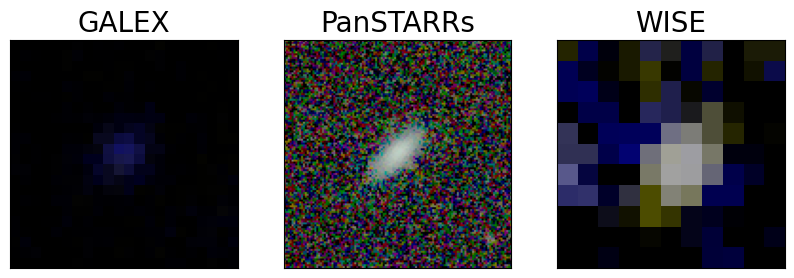

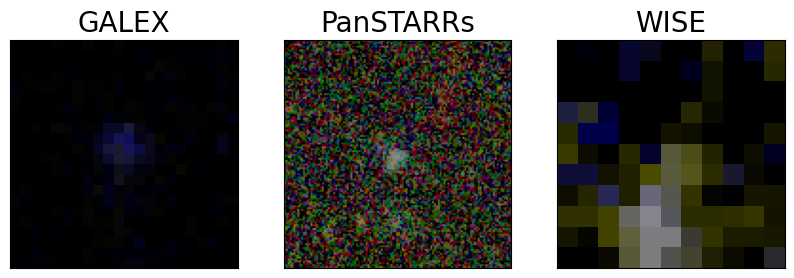

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


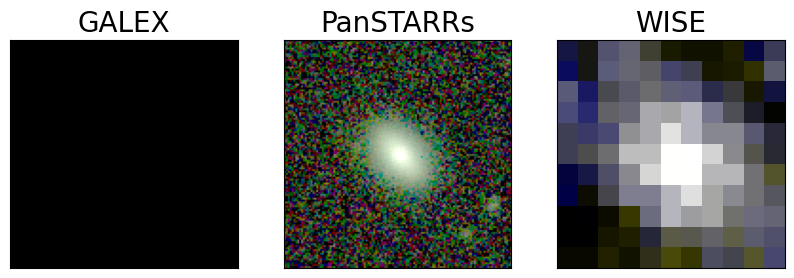

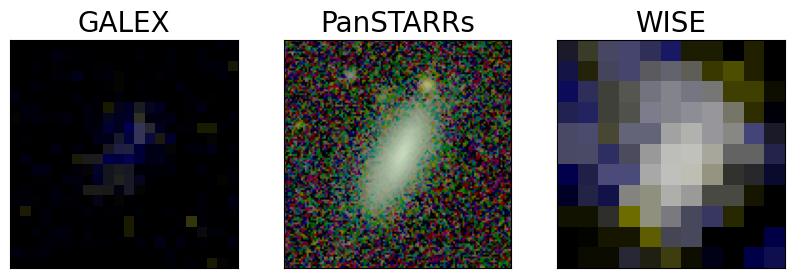

In [39]:
for k,j in enumerate(indices):
    galex,ps,unwise,__,__,__,__ = MSD[j]
    galex,ps,unwise = augment_fn_late(galex,ps,unwise)
    visualize(galex[0],ps[0],unwise[0],late=True)
    
    if k>100:
        break